In [1]:
import torch
import numpy as np
import torch.nn as nn
from tqdm import tqdm
from PIL import Image
from torch.optim import Adam, SGD, lr_scheduler
import matplotlib.pyplot as plt
from torchvision import transforms, models
# from UNET_LIB.Segformer import Segformer
from UNET_LIB.InceptionUnet import InceptionUNet
# from UNET_LIB.ResUnetPlusPlus import ResUnetPlusPlus
# from UNET_LIB.Unet import UNet
from utils import DiceLoss
from LAIPAS_Images.LAIPAS_DATA import LAIPAS_Dataset
from torch.utils.data import Dataset, Subset, DataLoader


img_preprocess = transforms.Compose([    
#     SquarePad(),
#     transforms.Resize(384),
    transforms.ColorJitter(brightness=0.15, contrast=0.15),
    transforms.ToTensor(),
    transforms.Normalize(0,1),
])

val_preprocess = transforms.Compose([    
#     SquarePad(),
#     transforms.RandomEqualize(p=0.5),
#     transforms.Resize(384),
    transforms.ToTensor(),
    transforms.Normalize(0,1),
])


msk_preprocess = transforms.Compose([
#     SquarePad(),
#     transforms.Resize(384, \
#             interpolation = transforms.InterpolationMode.NEAREST),
])

epochs = 240
variant = '_pat_bal'
optim_spec = 'AD'
weighted = ''
ignore=False
loss_spec = 'CE'
assert loss_spec in ['Dice', 'CE'] 
assert weighted in ['_weighted','']
# optim_spec = 'SGDL'

train_DATA = LAIPAS_Dataset('/data/LAIPAS_Images/', 'train'+variant, img_preprocess, msk_preprocess,crop_size=512,ignore=ignore)
val_DATA = LAIPAS_Dataset('/data/LAIPAS_Images/', 'val', val_preprocess, msk_preprocess,
                          rot = False, resize=False,crop_size = 1024,ignore=False)

num_classes = 4
# model = InceptionUNet(1, num_classes)
# model = Segformer()
# model = ResUnetPlusPlus(1, num_classes)

model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet101', pretrained=False)
model.backbone.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))

if loss_spec == 'Dice':
    loss_fn = DiceLoss() 
elif weighted == '':
    loss_fn = nn.CrossEntropyLoss(ignore_index=255)
else:
    loss_fn = nn.CrossEntropyLoss(ignore_index=255, reduction='none')
    
model = nn.DataParallel(model).cuda()
model_name = f'DLab101_LAIPAS_{variant}_o{optim_spec}{weighted}_no255'

train_loader = DataLoader(train_DATA, batch_size=16, shuffle=True, drop_last=True, num_workers=8)
val_loader = DataLoader(val_DATA, batch_size=8, shuffle=False, drop_last=False, num_workers=8)

min_loss = np.inf
fin_epoch = 0
if optim_spec == 'AD':
    optimizer = Adam(model.parameters(),lr=1e-2,eps=0.1, weight_decay=1e-6)

elif optim_spec == 'SGDL':
    optimizer = SGD([{'params':model.module.backbone.parameters(), 'lr': 1e-2},
                     {'params': model.module.classifier.parameters(), 'lr': 1e-1},
                    ],momentum=0.9,weight_decay=1e-4)
    scheduler = lr_scheduler.MultiStepLR(optimizer, milestones=[500*i for i in range(1,9)], gamma=0.8)
elif optim_spec == 'SGD':
    optimizer = SGD(model.parameters(),lr=1e-2,momentum=0.9,weight_decay=0.1)

else:
    assert False

try:
        checkpoint = torch.load(f'/data/LAIPAS_Images/model_checkpoints/{model_name}.pth')
        fin_epoch = checkpoint['fin_epoch']
        min_loss = checkpoint['min_loss']
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        print('optimizer loaded')
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
        print('scheduler loaded')
except:
    if fin_epoch ==0:
        print(f'new model training {model_name}')

Using cache found in /home/yz696/.cache/torch/hub/pytorch_vision_v0.10.0
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


optimizer loaded


In [2]:
pbar = tqdm(range(epochs-fin_epoch))

for e in pbar:
    train_loss, val_loss = 0, 0

    model.train()
    for idx,(X,y,w) in enumerate(train_loader):

        optimizer.zero_grad()
        if 'DLab' not in model_name:
            yhat = model(X.contiguous().cuda())
        else:
            yhat = model(X.contiguous().cuda())['out']

        loss = loss_fn(yhat,y.contiguous().cuda())
        if weighted != '' and loss_spec == 'CE':
            loss1 = (loss * w.contiguous().cuda()*5).mean()
            loss1.backward()
            loss = loss1
        else:
            loss.backward()
        optimizer.step()
        if optim_spec == 'SGDL':
            scheduler.step()

        train_loss += loss.item()
    train_loss /= (idx+1)

    model.eval()
    with torch.no_grad():
        class_intersect = np.zeros((num_classes,),dtype='float')
        class_union= np.zeros((num_classes,),dtype='float')
        for idx,(X,y) in enumerate(val_loader):
            y = y.cuda().contiguous().flatten()
            if 'DLab' not in model_name:
                yhat = model(X.contiguous().cuda())
            else:
                yhat = model(X.contiguous().cuda())['out']
            yhat_lab = torch.argmax(yhat, dim=1).flatten()

            for j in range(num_classes):

                y_bi = y == j
                yhat_bi = yhat_lab == j
                I = ((y_bi * yhat_bi).sum()).item()
                U = (y_bi.sum() + yhat_bi.sum() - I).item()
                assert I <= U
                class_intersect[j] += I
                class_union[j] += U

        IOUs = class_intersect/class_union
        val_loss=-np.mean(IOUs)
        pbar.set_description(f'Train loss: {train_loss}| IOU: {-val_loss}')

        #Dynamic class weight adjustment for loss function
        if loss_spec == 'CE':
            boost = 1/np.clip(IOUs,5e-2,1)
            boost = torch.tensor(boost/boost.sum(),dtype=torch.float).cuda().squeeze()
            if weighted == '':
                loss_fn = nn.CrossEntropyLoss(weight = boost, ignore_index = 255)
            else:
                loss_fn = nn.CrossEntropyLoss(weight = boost, ignore_index = 255,reduction='none')

    if e +fin_epoch+1 <10:
        continue

    if val_loss < min_loss:
        min_loss = val_loss
        to_save ={
            'min_loss': min_loss,
            'fin_epoch': e+fin_epoch+1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict()}
        if optim_spec == 'SGDL':
            to_save['scheduler_state_dict']= scheduler.state_dict()

        torch.save(to_save, f'/data/LAIPAS_Images/model_checkpoints/{model_name}.pth')  


Train loss: 0.027229223204286473| IOU: 0.6213751822573269: 100%|██████████████████████████| 240/240 [4:11:28<00:00, 62.87s/it]


In [2]:
from torch.utils.data import ConcatDataset
checkpoint = torch.load('/data/LAIPAS_Images/model_checkpoints/DLab101_LAIPAS__pat_bal_oAD_no255.pth')
model.load_state_dict(checkpoint['model_state_dict'])
val_test = Subset(LAIPAS_Dataset('/data/LAIPAS_Images/', 'val', val_preprocess, msk_preprocess,
                          rot = False, resize=False,crop_size = 1024,ignore=False), range(28,72))

ctl_test = Subset(LAIPAS_Dataset('/data/LAIPAS_Images/', 'ctl', val_preprocess, msk_preprocess,
                          rot = False, resize=False,crop_size = 1024,ignore=False), range(73,98))

test = ConcatDataset([val_test,ctl_test])
test_loader = DataLoader(test, batch_size=8, shuffle=False, drop_last=False, num_workers=8,pin_memory=True)

In [3]:
pred = []
orig = []
img_ = []
model.eval()
with torch.no_grad():
    class_intersect = np.zeros((num_classes,),dtype='float')
    class_union= np.zeros((num_classes,),dtype='float')
    for idx,(X,y) in enumerate(test_loader):
        y = y.cuda().contiguous()
        orig.append(y)
        img_.append(X)
        if 'DLab' not in model_name:
            yhat = model(X.contiguous().cuda())
        else:
            yhat = model(X.contiguous().cuda())['out']
        yhat_lab = torch.argmax(yhat, dim=1)
        for j in range(num_classes):

            y_bi = y == j
            yhat_bi = yhat_lab == j
            I = ((y_bi * yhat_bi).sum()).item()
            U = (y_bi.sum() + yhat_bi.sum() - I).item()
            assert I <= U
            class_intersect[j] += I
            class_union[j] += U
            
        pred.append(yhat_lab)
    yhat_lab = torch.cat(pred)
    y = torch.cat(orig)
    X = torch.cat(img_)
        

In [4]:
(class_intersect/class_union)

array([0.72052813, 0.65489738, 0.42606032, 0.30322268])

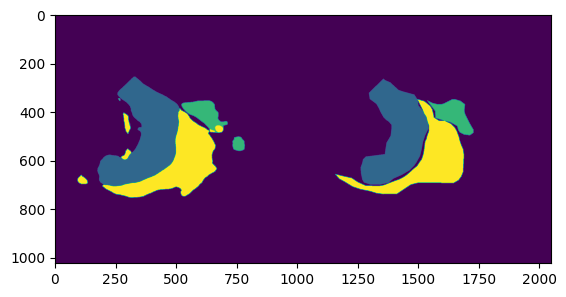

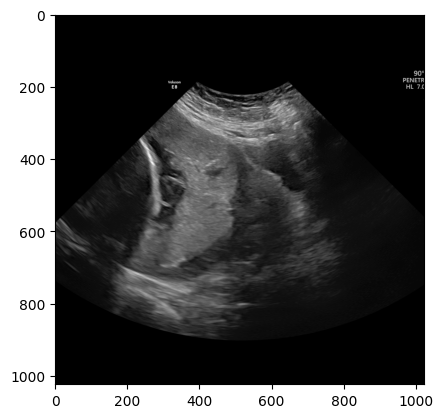

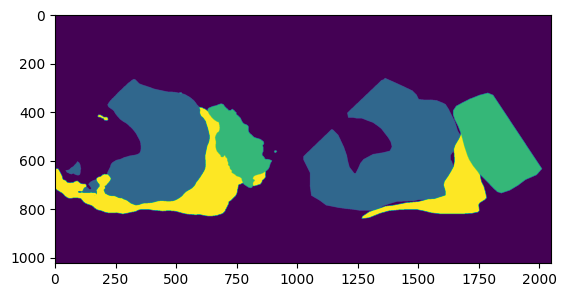

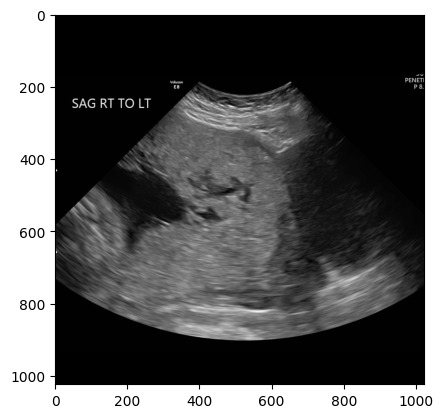

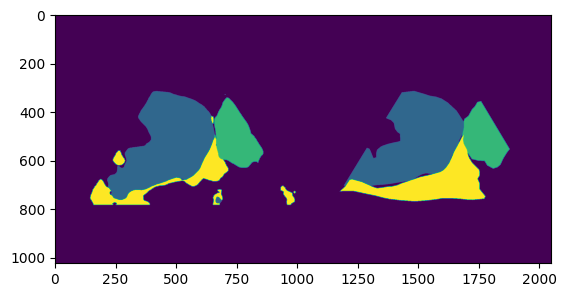

...

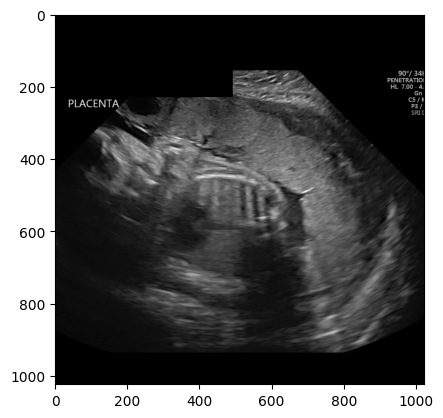

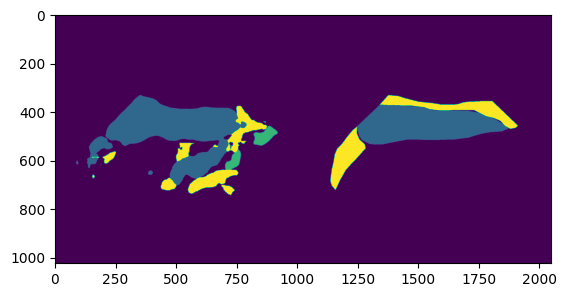

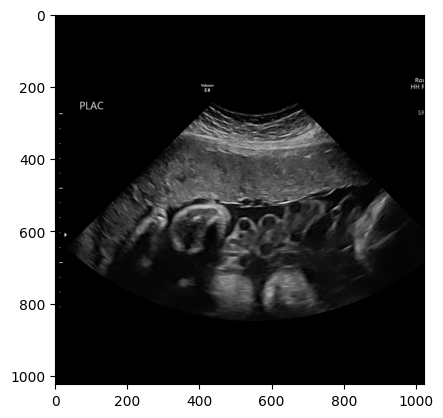

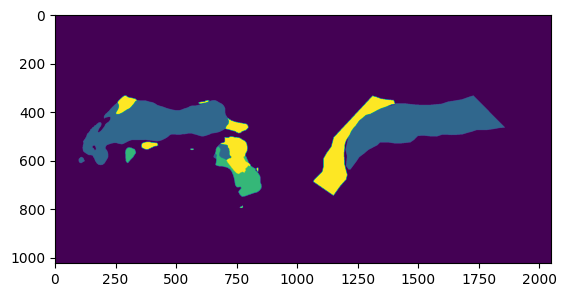

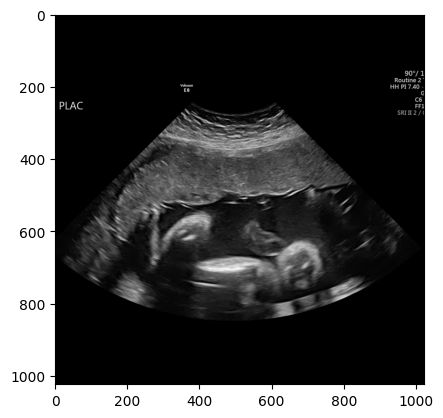

In [7]:
for _ylab,_y, _x in zip(yhat_lab.cpu(), y.cpu(), X):
    _ylab[_y==255]=0
    _x.squeeze()[_y==255]=0
    _y[_y==255]=0
    
    plt.imshow(torch.cat([_ylab,_y],axis=1))
    plt.show()
    plt.imshow(_x.squeeze(),cmap='gray')
    plt.show()

In [8]:
checkpoint = torch.load('/data/final_model/DLab101_LAIPAS__pat_bal_oSGDL_no255_MT_wCTL_21kIter_poly.pth')
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [10]:
pred = []
orig = []
img_ = []
model.eval()
with torch.no_grad():
    class_intersect = np.zeros((num_classes,),dtype='float')
    class_union= np.zeros((num_classes,),dtype='float')
    for idx,(X,y) in enumerate(test_loader):
        y = y.cuda().contiguous()
        orig.append(y)
        img_.append(X)
        if 'DLab' not in model_name:
            yhat = model(X.contiguous().cuda())
        else:
            yhat = model(X.contiguous().cuda())['out']
        yhat_lab = torch.argmax(yhat, dim=1)
        for j in range(num_classes):

            y_bi = y == j
            yhat_bi = yhat_lab == j
            I = ((y_bi * yhat_bi).sum()).item()
            U = (y_bi.sum() + yhat_bi.sum() - I).item()
            assert I <= U
            class_intersect[j] += I
            class_union[j] += U
            
        pred.append(yhat_lab)
    yhat_lab = torch.cat(pred)
    y = torch.cat(orig)
    X = torch.cat(img_)
        

In [11]:
(class_intersect/class_union)

array([0.74790705, 0.7519699 , 0.49114192, 0.38902252])

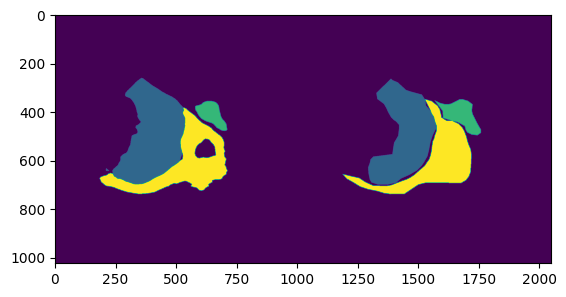

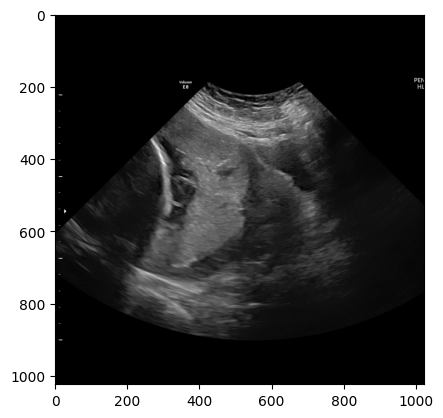

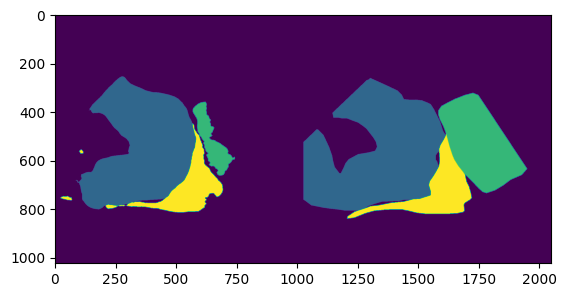

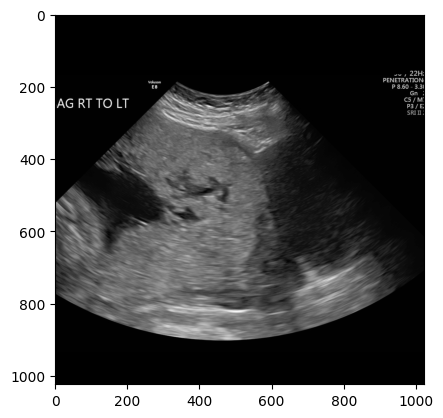

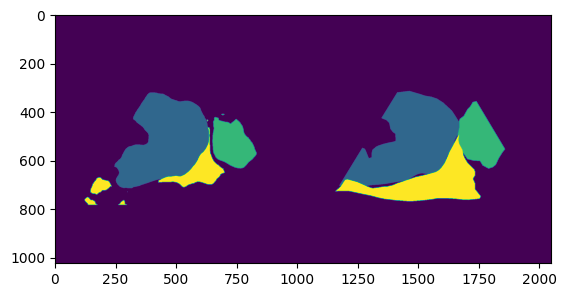

...

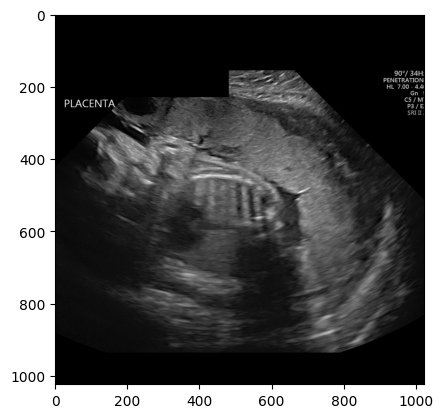

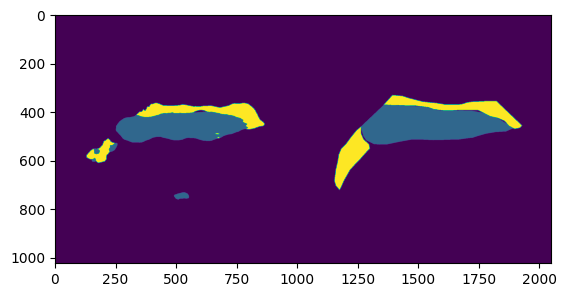

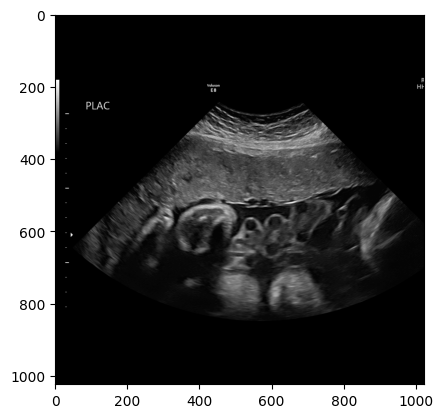

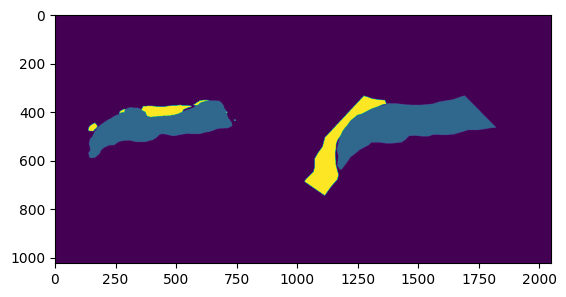

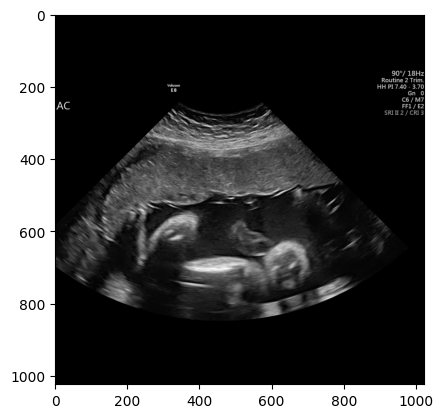

In [12]:
for _ylab,_y, _x in zip(yhat_lab.cpu(), y.cpu(), X):
    _ylab[_y==255]=0
    _x.squeeze()[_y==255]=0
    _y[_y==255]=0
    
    plt.imshow(torch.cat([_ylab,_y],axis=1))
    plt.show()
    plt.imshow(_x.squeeze(),cmap='gray')
    plt.show()